# EXPERIMENT - STATE-GROUP-3

# State Groups:

- `group_1`: Patients with low toxicity and low tumor size  - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_2`: Patients with high toxicity and low tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_3`: Patients with low initial toxicity and high tumor size - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
- `group_4`: Patients with high toxicity and high tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
-  `None`  : Patients with toxicity and tumor size sample from - W_0 ~ U(0,2), T_0 ~  U(0,2)

In [1]:
%load_ext autoreload
%autoreload 2

import tqdm
import _set_path
from pbpi.algo_core.training import evaluations_per_config

In [2]:
ALGO_TYPE = {'original': {'name': 'original', 'exploration': False}
            ,'modified': {'name': 'modified', 'exploration': True} }

---
## Using `tumor size + toxicity` to generate preferences

### Original algorithm

In [7]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 3
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 16


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


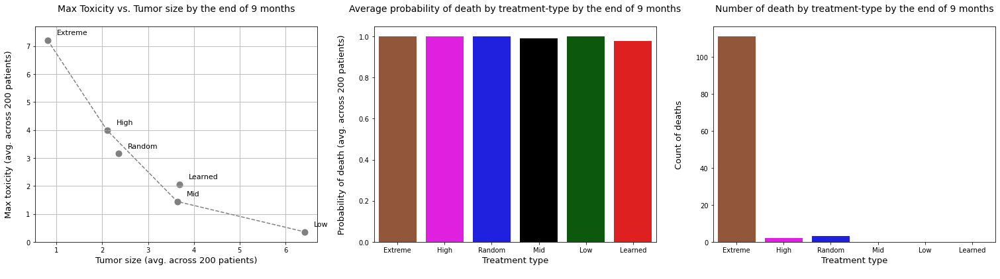

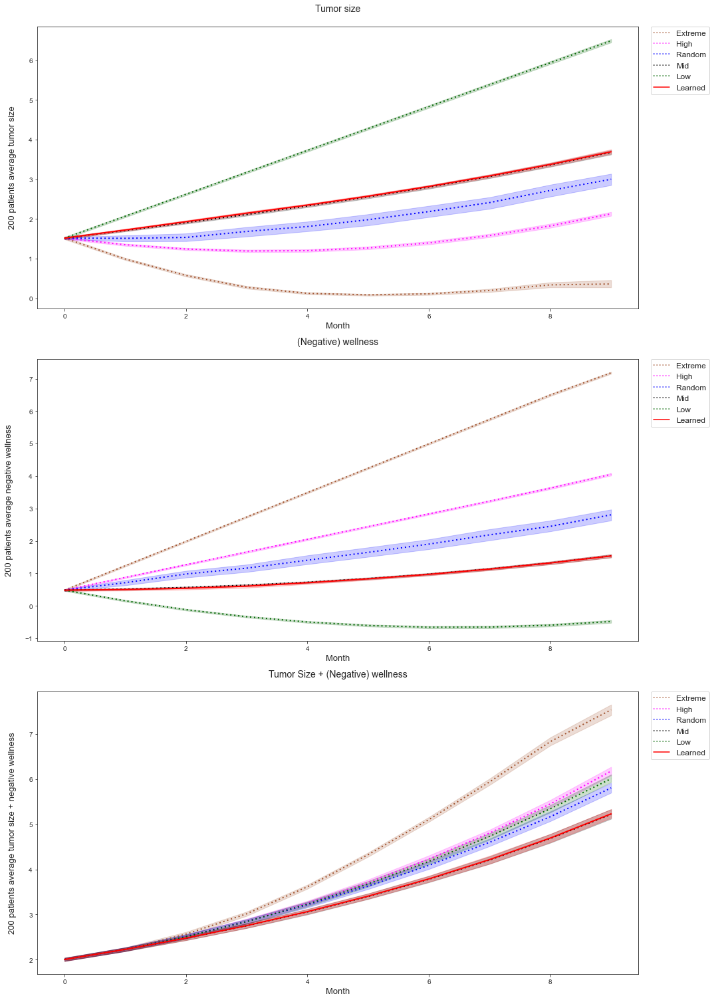


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 3.6929945561050515
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.669429787659529
                         - Avg. prob. of death : 0.9795984836312366



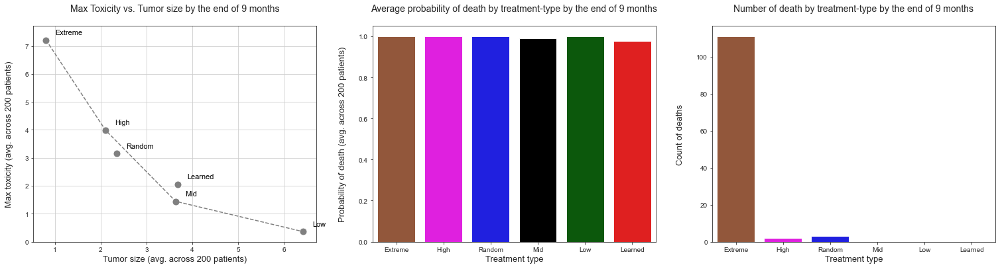

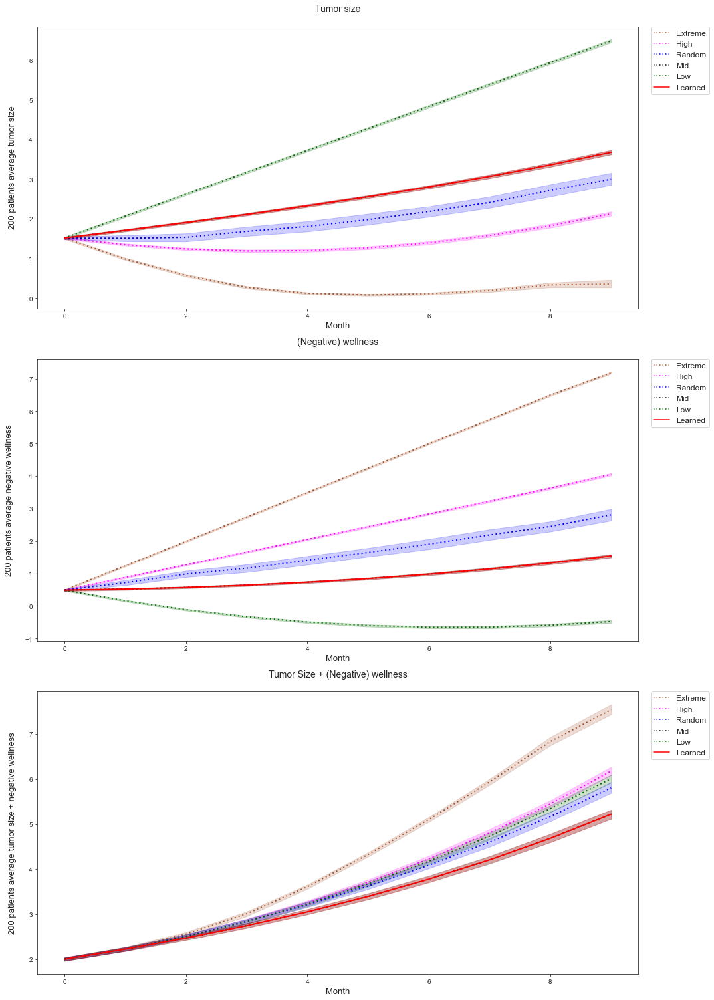


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313



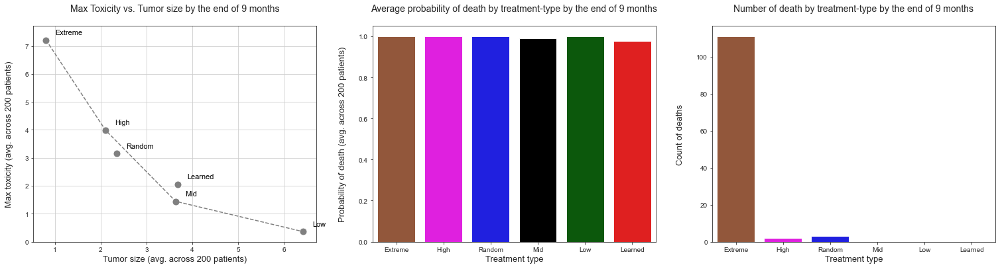

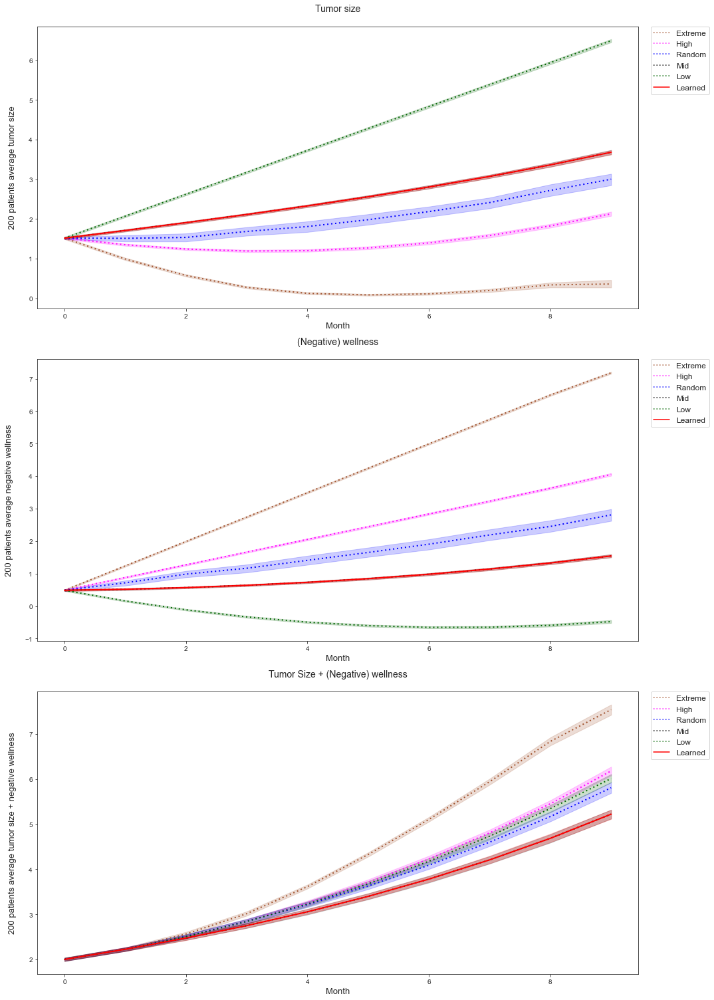


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313



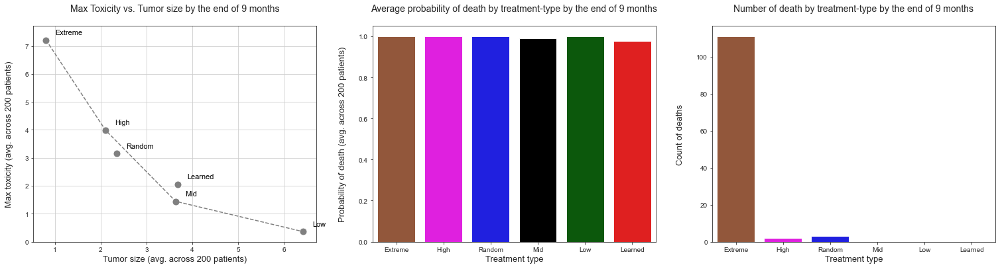

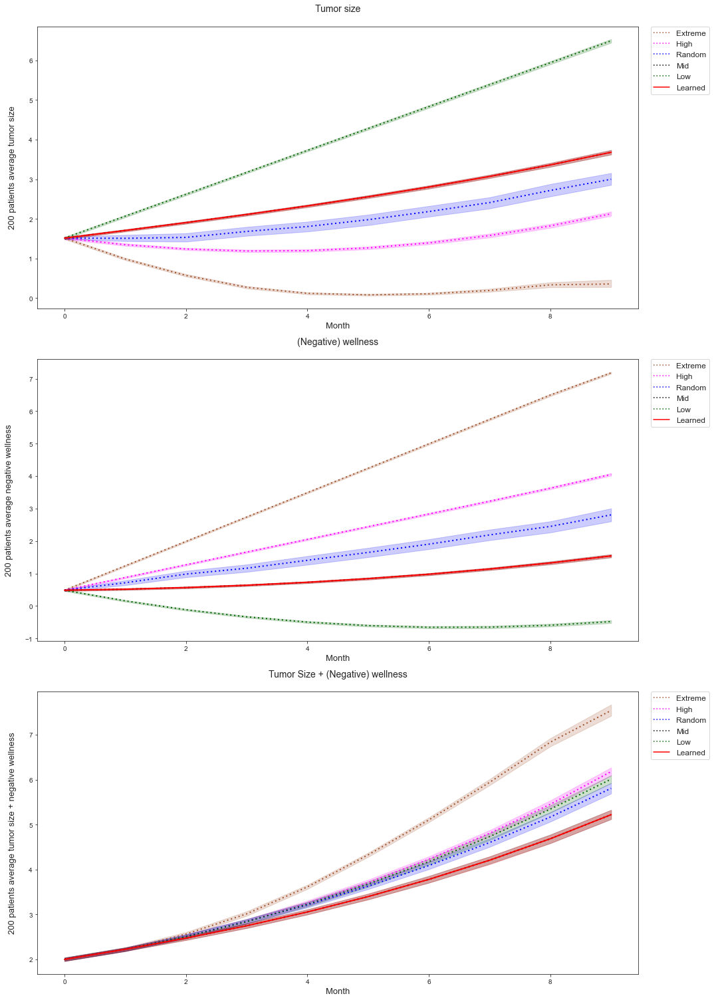


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313



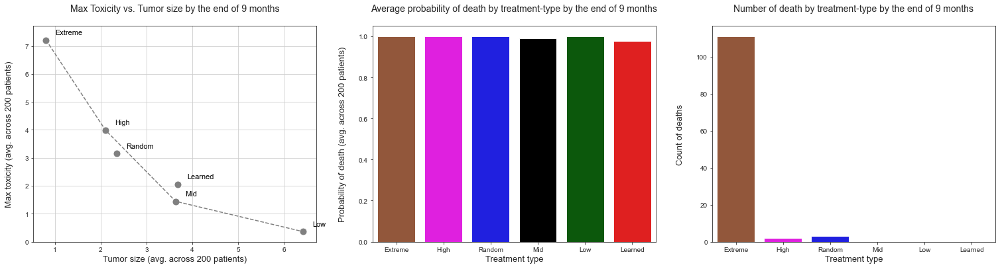

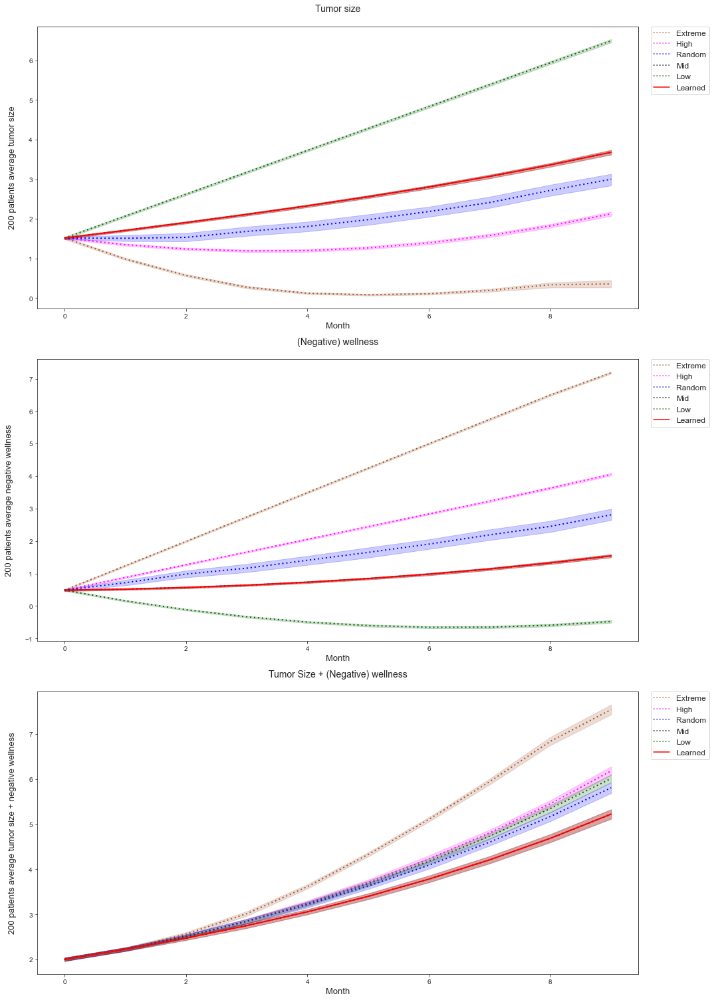


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313



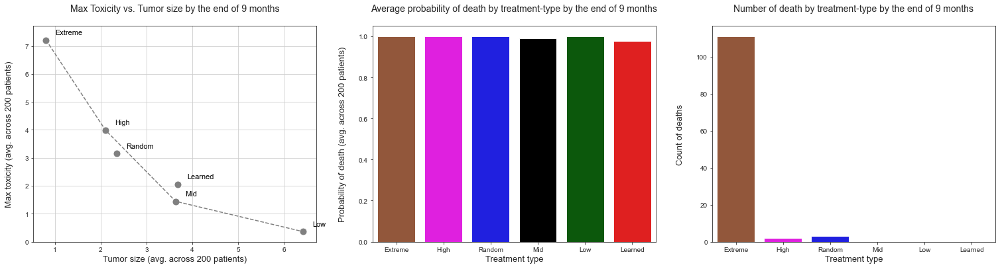

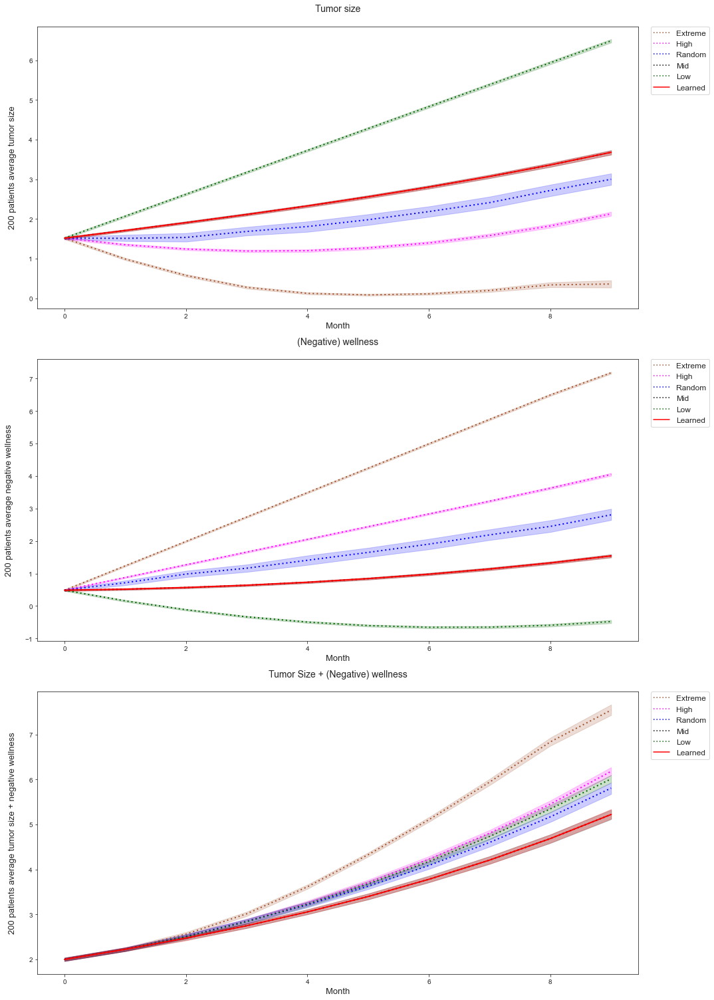


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313



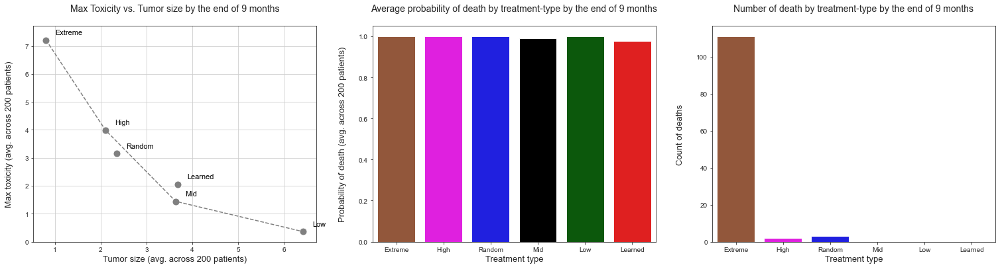

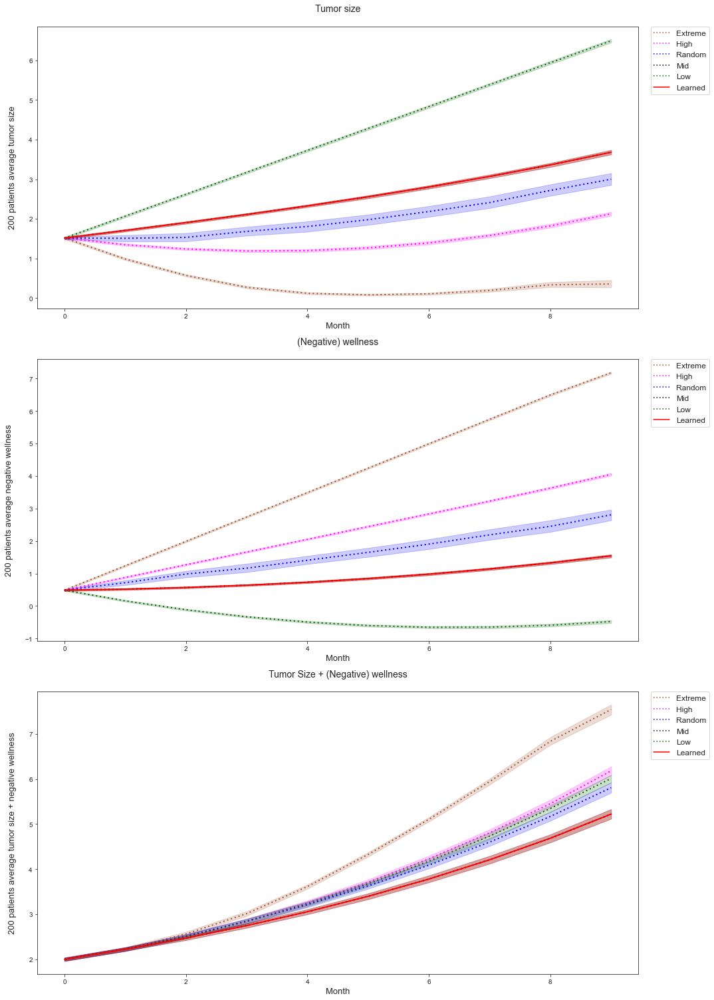


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313



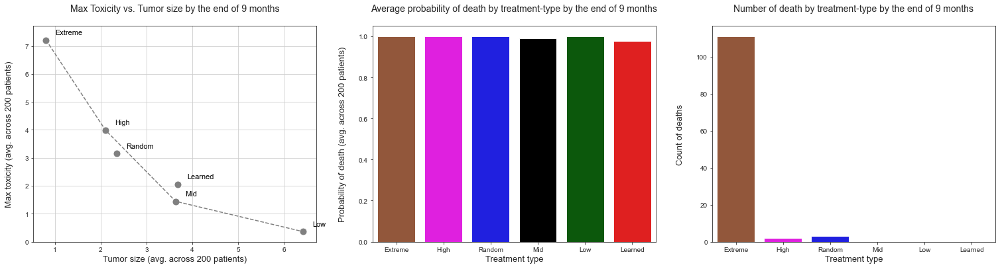

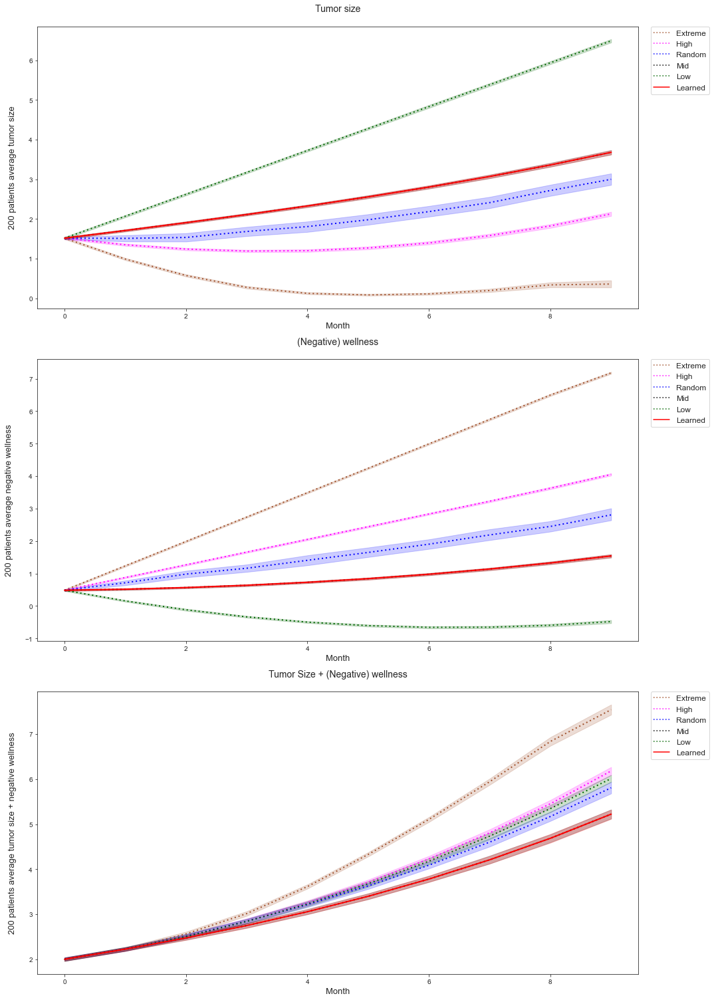


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313



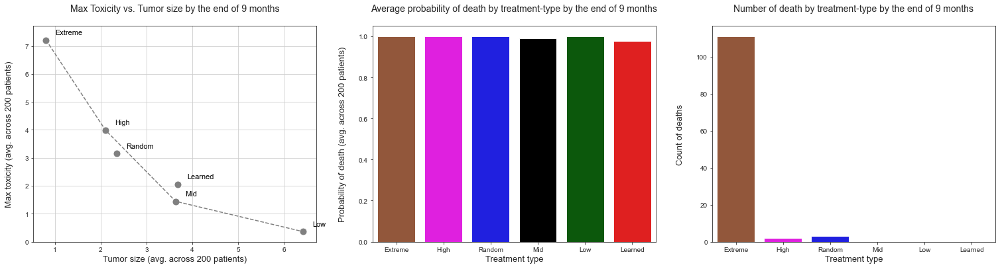

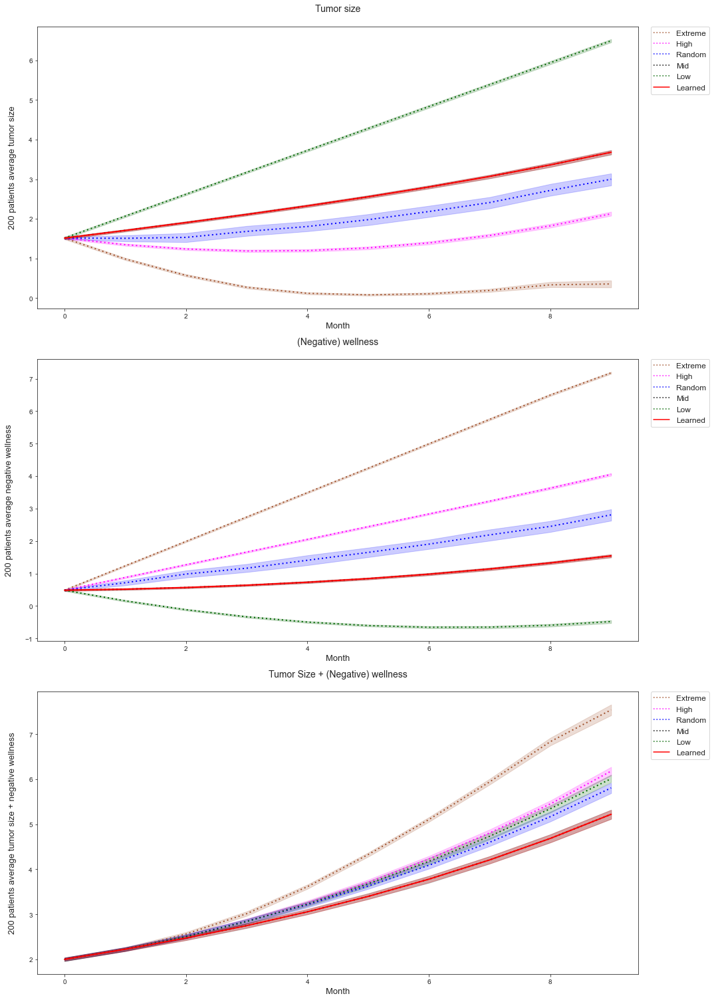


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313



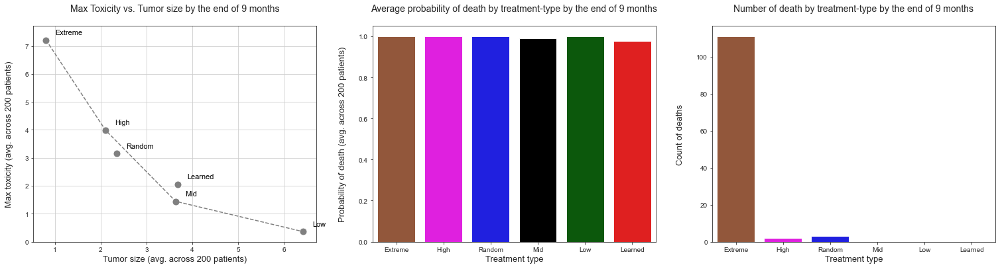

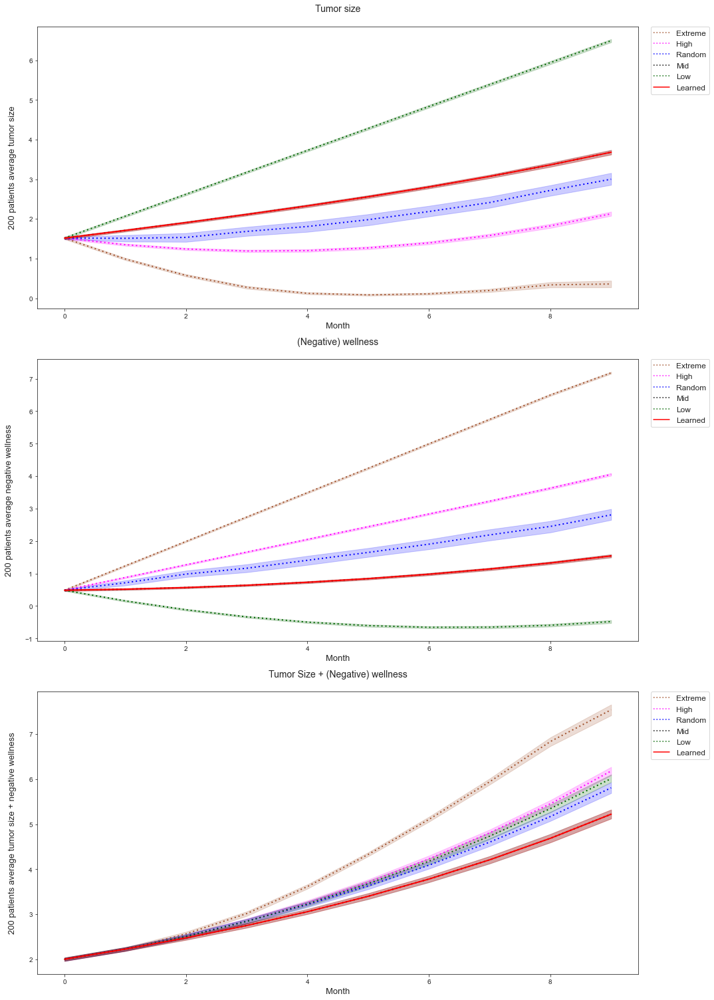


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313


Evaluations: 100%|██████████| 1/1 [3:27:16<00:00, 12436.83s/it]


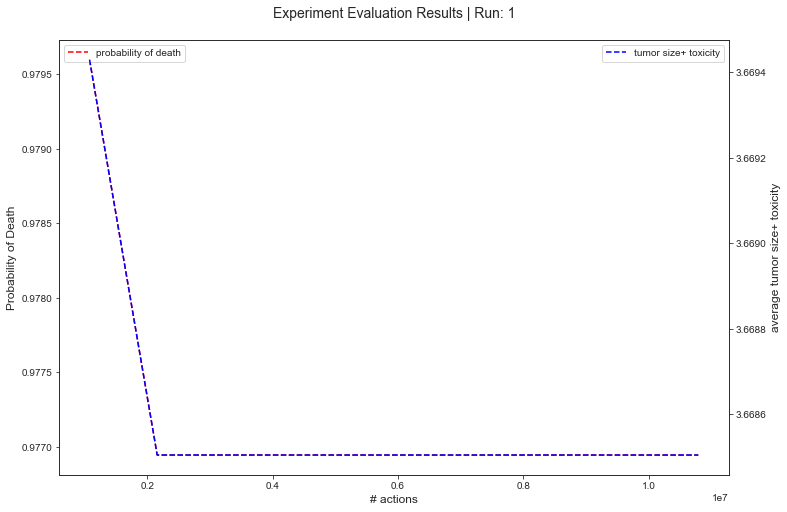

In [4]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 8
                                                , treatment_length_eval     = 8
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [5]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 4
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 16


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


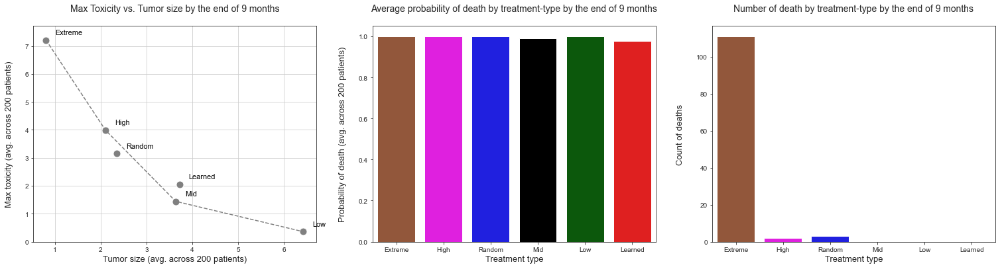

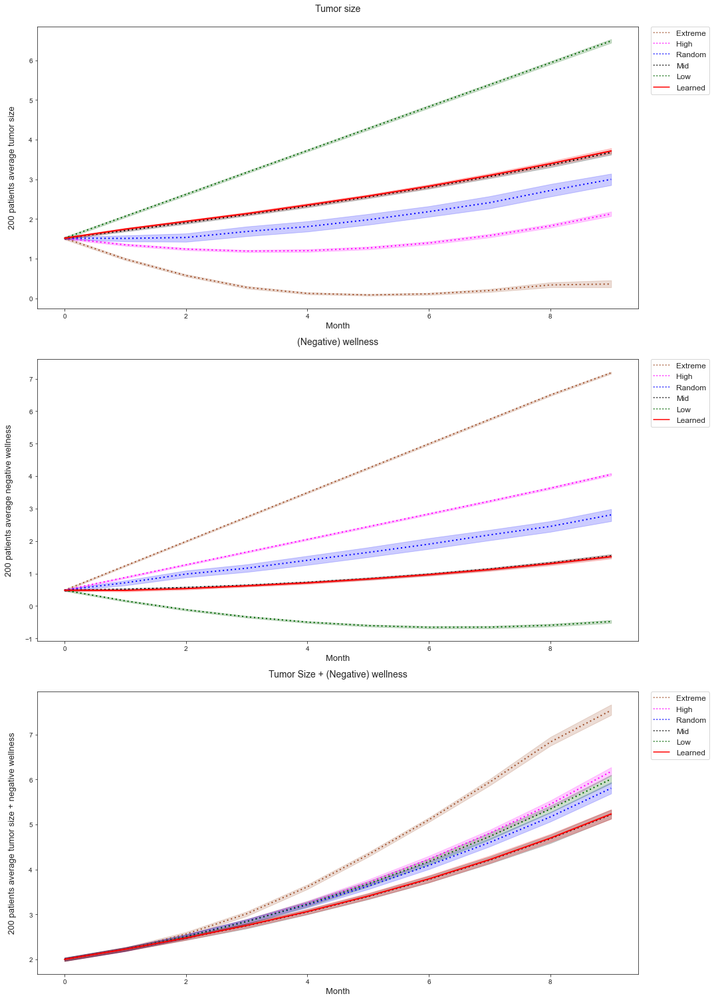


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 3.7164991121269315
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6697523251415136
                         - Avg. prob. of death : 0.9788754759524501



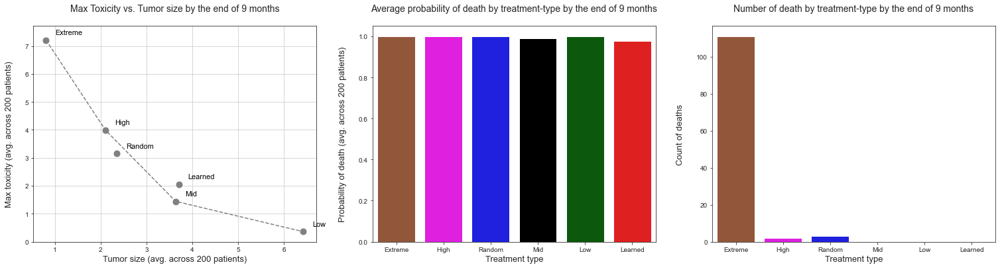

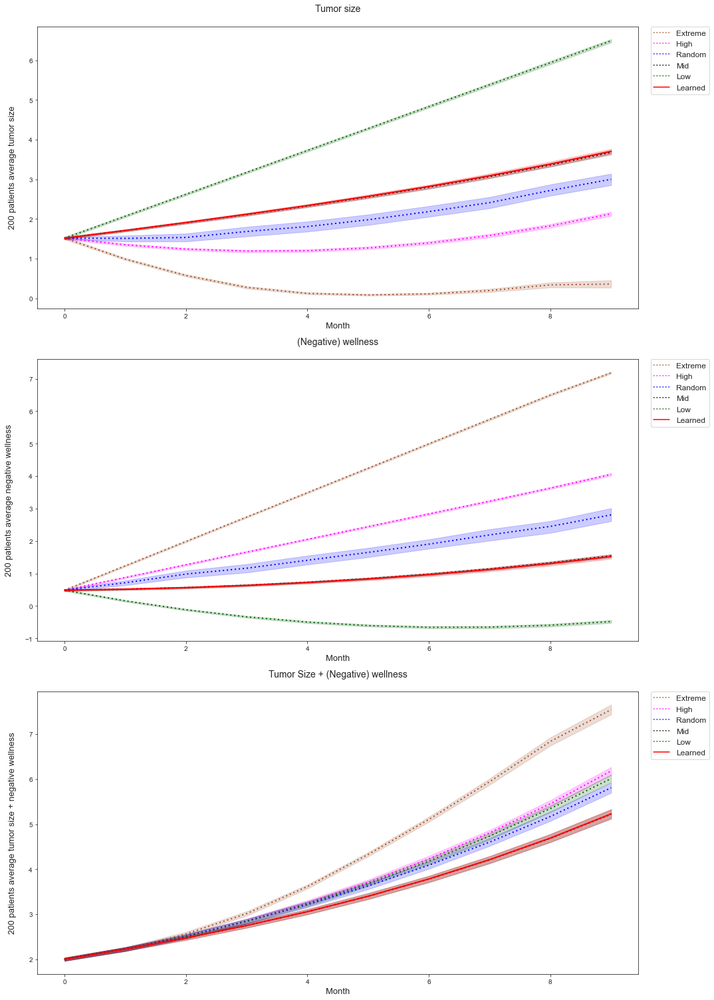


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 3.7047691489096373
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6687893937369433
                         - Avg. prob. of death : 0.9778506375201996



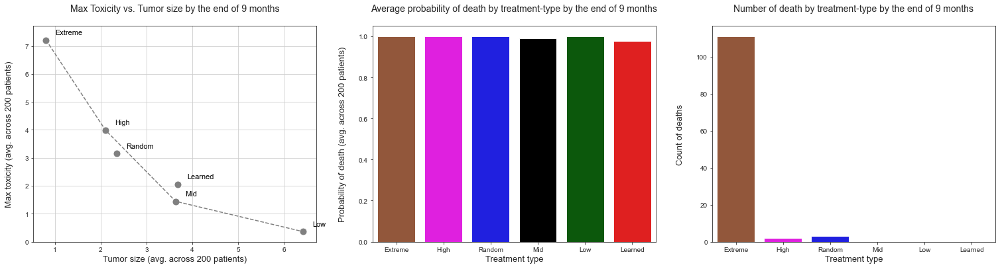

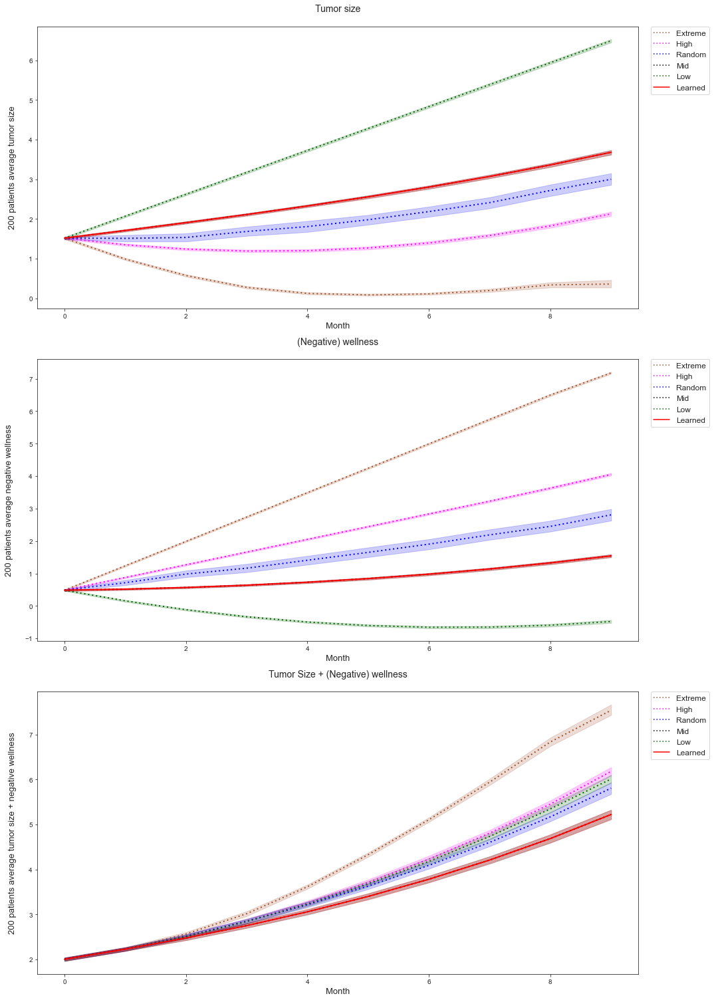


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6685036361093655
                         - Avg. prob. of death : 0.9769428858447313



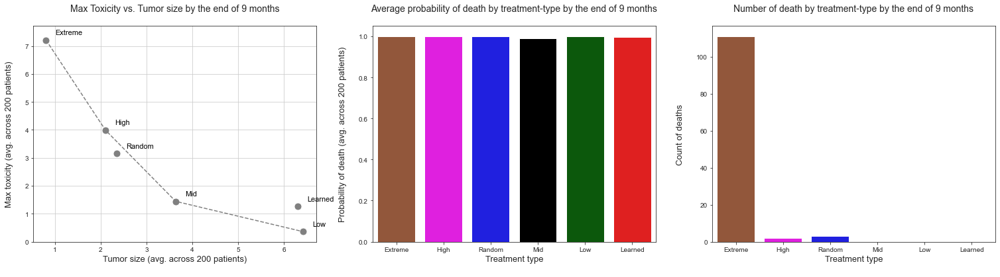

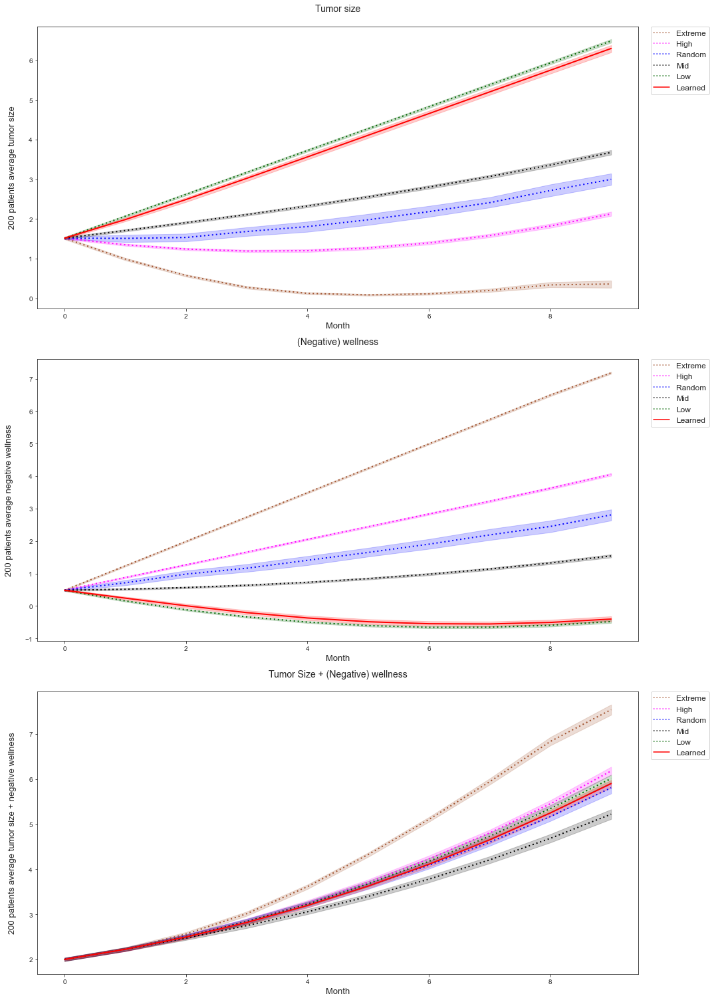


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 6.303080022055398
                         - Avg. max. toxicity : 1.2600504405835942
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.7099770522716193
                         - Avg. prob. of death : 0.9983131800031358



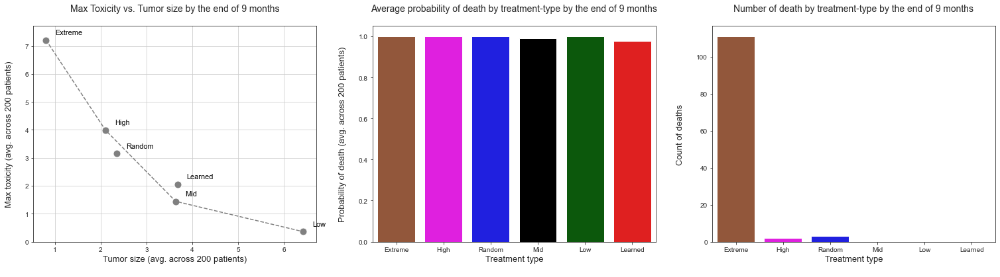

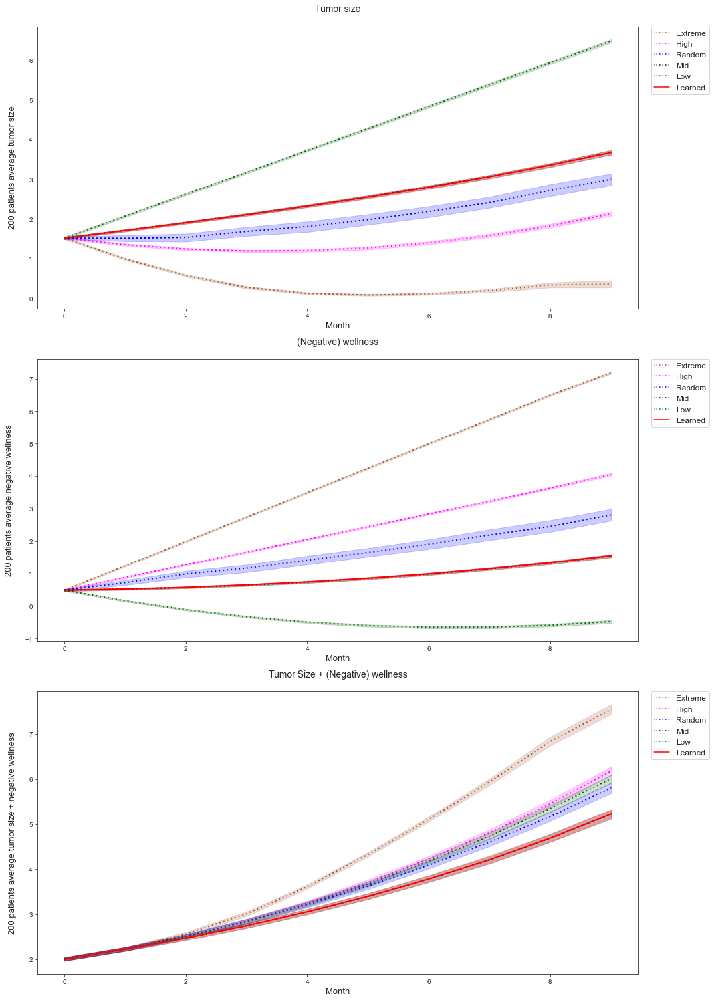


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 3.677219657162618
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6687492586910775
                         - Avg. prob. of death : 0.9775804434229239



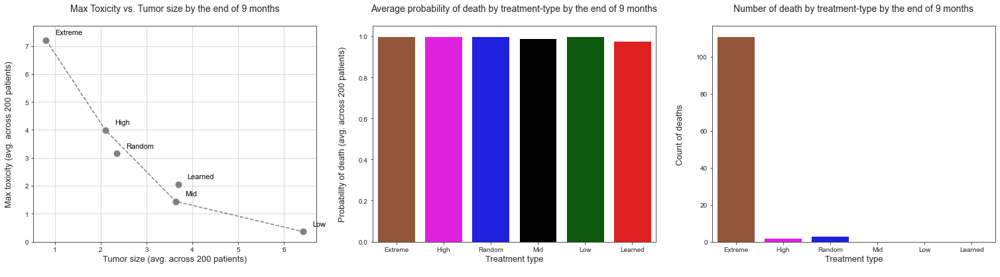

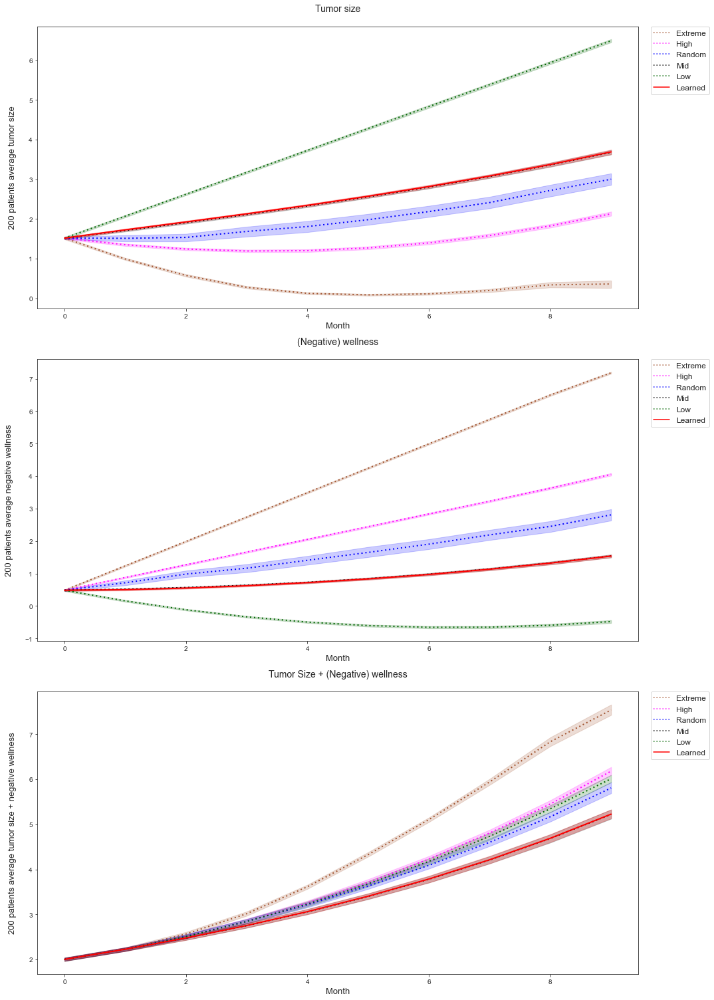


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 3.6895976714733894
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.669043231382902
                         - Avg. prob. of death : 0.9771785428908062



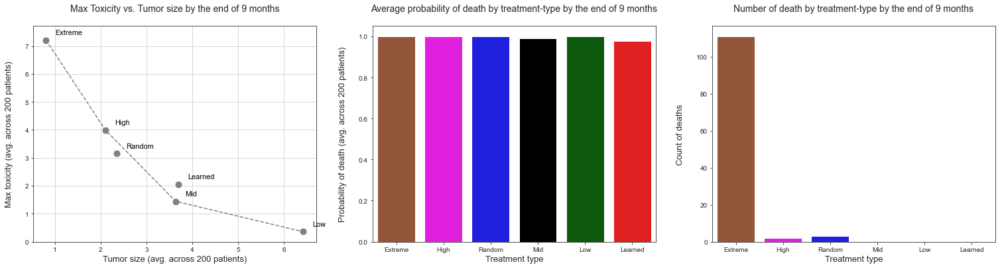

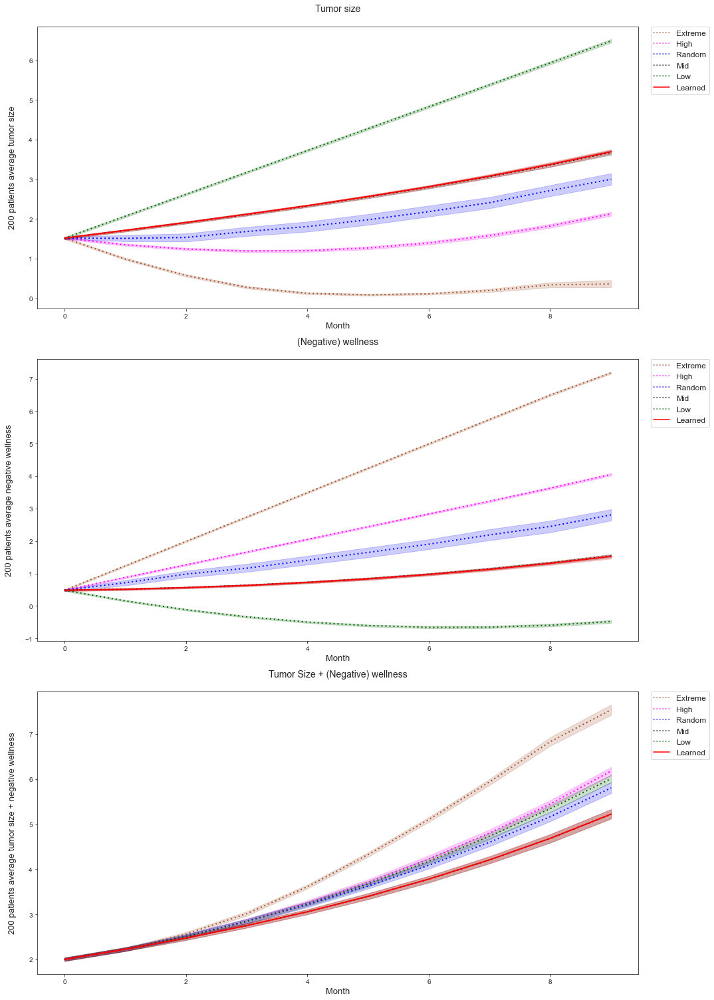


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 3.6975067702362985
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6686998671537987
                         - Avg. prob. of death : 0.9775143837778164



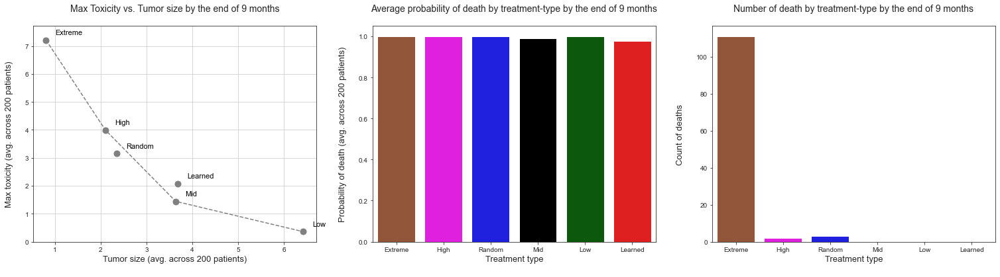

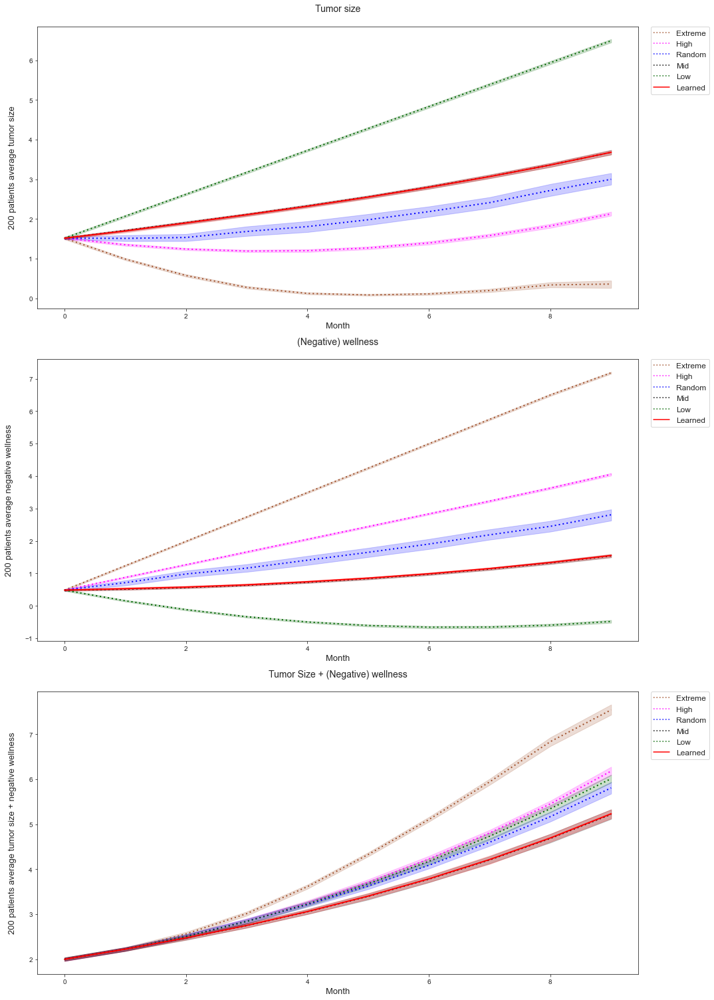


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 3.6802745538548067
                         - Avg. max. toxicity : 2.072301089697404
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6693472742769124
                         - Avg. prob. of death : 0.9776098080447018



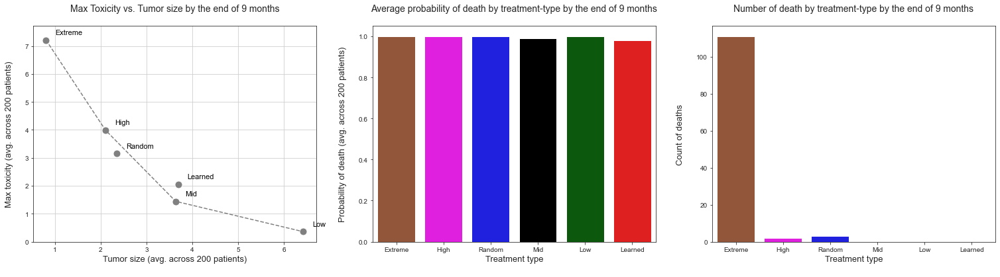

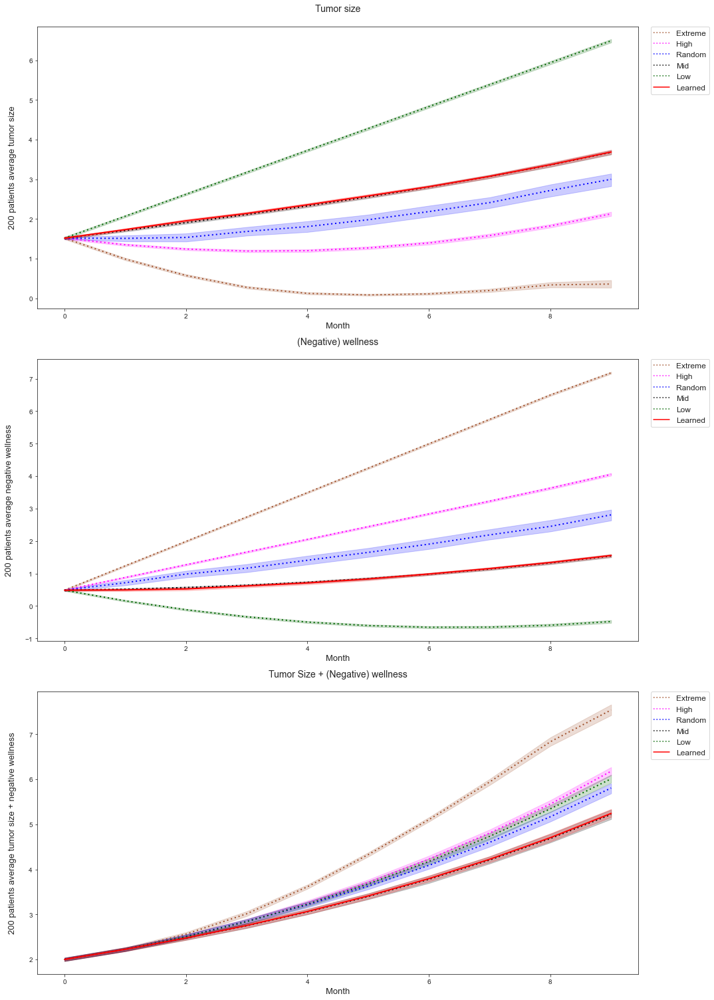


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 3.688101100775397
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6702225280334346
                         - Avg. prob. of death : 0.9816151244367041



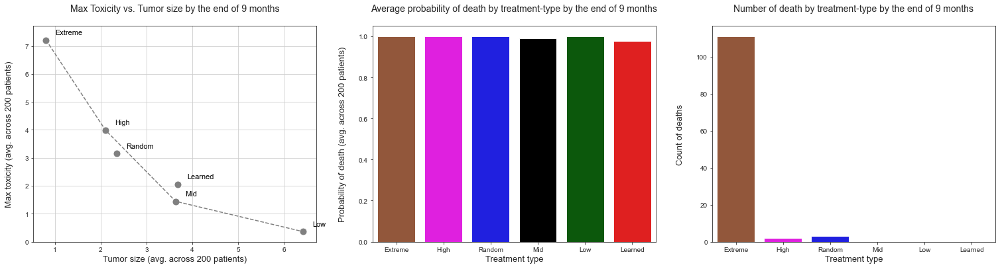

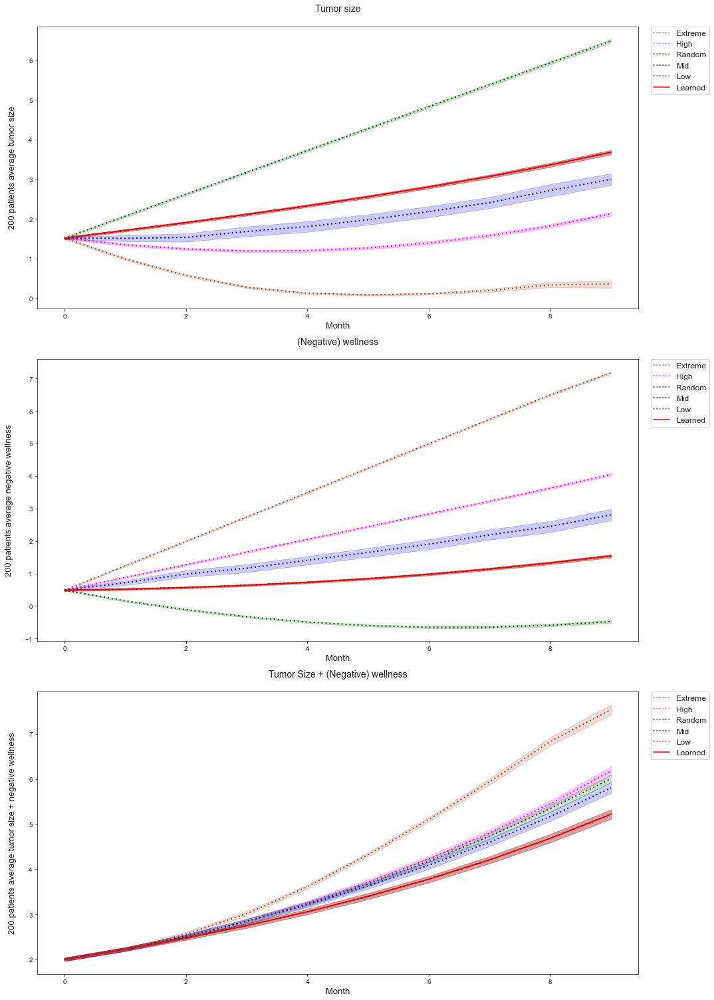


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 3.6819422435243725
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.668577347458958
                         - Avg. prob. of death : 0.9770897735669428


Evaluations: 100%|██████████| 1/1 [2:19:21<00:00, 8361.29s/it]


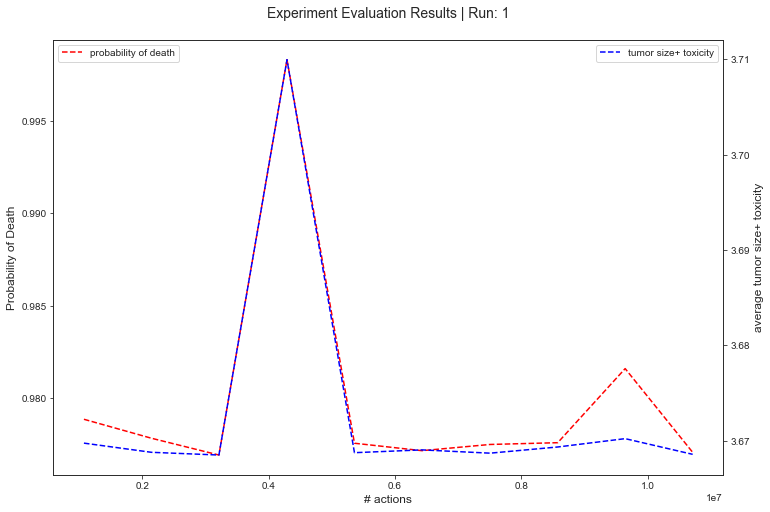

In [6]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 8
                                                , treatment_length_eval     = 8
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()